In [32]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib as mpl

def plot_adata(adata_to_plot, cluster_key, plot_type="umap", keyword=None, save=None, Title = "UMAP or Spatial embedding — clusters"):
    """
    Plot AnnData embeddings (UMAP or spatial) with optional HTML export.

    Parameters:
    - adata_to_plot: AnnData object with .obsm and .obs fields.
    - cluster_key: key in adata.obs to color by.
    - plot_type: "umap" or "spatial".
    - keyword: if provided, highlight clusters containing this substring; others grouped as "Other".
    - save: if None, do not save; if str, full path/filename to save as HTML (no extension needed).
    """

    # Prepare DataFrame for plotting
    if plot_type == "spatial":
        coords = adata_to_plot.obsm['spatial'].copy()
        df = pd.DataFrame(coords, columns=['x', 'y'], index=adata_to_plot.obs_names)
    else:  # UMAP
        df = pd.DataFrame(
            adata_to_plot.obsm['X_umap'],
            columns=['UMAP1', 'UMAP2'],
            index=adata_to_plot.obs_names
        )

    # Original cluster labels as strings
    df[cluster_key] = adata_to_plot.obs[cluster_key].astype(str)

    # If a keyword is provided, label matching clusters, others as "Other"
    if keyword:
        df['plot_label'] = df[cluster_key].apply(lambda x: x if keyword in x else 'Other')
        color_key = 'plot_label'
        legend_title = f"Highlighted: {keyword}"
    else:
        color_key = cluster_key
        legend_title = cluster_key

    # Get a discrete color map
    tab20 = [mpl.colors.rgb2hex(c) for c in plt.get_cmap('tab20').colors]

    # Choose appropriate scatter fields
    if plot_type == "spatial":
        fig = px.scatter(
            df,
            x='x',
            y='y',
            color=color_key,
            title=Title,
            hover_name=df.index,
            width=1600,
            height=700
        )
        fig.update_traces(marker=dict(size=2, opacity=0.8))
        fig.update_yaxes(autorange='reversed')
    else:  # UMAP
        fig = px.scatter(
            df,
            x='UMAP1',
            y='UMAP2',
            color=color_key,
            title=Title,
            color_discrete_sequence=tab20,
            hover_name=df.index,
            width=1400,
            height=1200
        )
        fig.update_traces(marker=dict(size=3, opacity=0.8))

    # Adjust layout
    fig.update_layout(
        legend_title_text=legend_title,
        legend=dict(
            itemsizing='constant',
            traceorder='normal',
            bgcolor='rgba(255,255,255,0.5)',
            x=1.02,
            y=1
        ),
        margin=dict(l=20, r=200, t=50, b=20)
    )

    # Show plot
    fig.show()

    # Save if a path is given
    if isinstance(save, str):
        fig.write_html(f"{save}.html")

## Load the Adata

In [33]:
import spatialdata
import scanpy as sc


Tissue = "Region3"
#MajorType = "Mesenchymal_SubTypes"

#adata = sc.read_h5ad(f'/Volumes/ProstateCancerEvoMain/dbs/Ongoing/Collection/MajorAnnGroups/Results/{Tissue}/{Tissue}.{MajorType}.AnnDC.h5ad')
adata = sc.read_h5ad(f'/Volumes/ProstateCancerEvoMain/dbs/Ongoing/Collection/MajorAnnGroups/Results/{Tissue}/{Tissue}.AnnDc.All.h5ad')
adata

AnnData object with n_obs × n_vars = 152944 × 5101
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'cell_type', 'leiden', 'major_cell_type_xenium_panel', 'assigned_celltype', 'MajorTypes'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals', 'spatial'

## Run FGSEA for the Groups

In [34]:
import scanpy as sc
import gseapy as gp

def go_fgsea(adata, comp, cluster_key="leiden" ,gene_set="MSigDB_Hallmark_2020", show_plot=False):
    """
    Perform FGSEA comparing 'comp' vs. all other cells.

    Parameters:
    - adata: AnnData object with .obs["assigned_celltype"] defined.
    - comp: cell type name to treat as the “Delta” group.
    - gene_set: either a gene‐set library name (e.g. "KEGG_2016") or a path to a GMT file.
    - show_plot: if True, show a UMAP of comp vs. the rest.

    Returns:
    - pre_res.res2d: a DataFrame of FGSEA results (NES, p‐value, etc.).
    """

    # Delta = cells where assigned_celltype == comp
    Delta = adata[adata.obs[cluster_key] == comp]

    # Reference = all cells NOT equal to comp
    Reference = adata[adata.obs[cluster_key] != comp]

    # Concatenate Reference + Delta, labeling in a new 'subset' column
    adata_concat = sc.concat(
        [Reference, Delta],
        axis=0,
        join="inner",                # keep only shared variables
        label="subset",
        keys=[f"Not_{comp}", comp],  # labels: "Not_comp" vs. "comp"
        merge="same"                 # var‐entries are identical
    )

    if show_plot:
        sc.pl.umap(
            adata_concat,
            color="subset",
            palette=["gray", "red"],
            size=20,
            title=f"UMAP: {comp} vs. Other Cells",
            alpha=0.4
        )

    # 1) Compute differential expression: Delta (comp) vs. Reference (all others)
    sc.tl.rank_genes_groups(
        adata_concat,
        groupby="subset",
        groups=[comp],
        reference=f"Not_{comp}",
        method="t-test"
    )

    # 2) Extract a pre‐ranked list of genes (log₂‐fold‐changes for comp)
    de_df = sc.get.rank_genes_groups_df(
        adata_concat,
        group=comp,
        key="rank_genes_groups"
    )
    rnk = de_df.set_index("names")["logfoldchanges"]

    # 3) Run FGSEA prerank
    pre_res = gp.prerank(
        rnk=rnk,
        gene_sets=gene_set,
        processes=4,
        permutation_num=1000,
        outdir=None
    )

    return pre_res.res2d[["Term","NES"]]

In [42]:
HLMRK = list()

adata_TM = adata.obs[adata.obs["assigned_celltype"] == "tumor_cell_markers"] 

for TOI in set(adata_TM["leiden"].values):
    print(TOI)
    df = go_fgsea(adata, TOI)
    HLMRK.append(df)

HLMRK

5


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:22:42,402 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!
2025-06-05 11:22:42,417 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


10


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:22:53,834 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!


3


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:23:02,829 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!


7


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:23:12,178 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!


1


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:23:20,048 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!


0


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:23:28,247 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!


11


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:23:38,196 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!


6


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:23:47,368 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!


4


/Users/ugursahin/miniforge3/envs/SOPA/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/758791172.py:62: DeprecationWarning:

processes is deprecated; use threads

2025-06-05 11:23:59,427 [WARNING] Input gene rankings contains NA values(gene name and ranking value), drop them all!


[                                 Term       NES
 0             Cholesterol Homeostasis  1.444589
 1           Interferon Alpha Response  1.426198
 2                   Protein Secretion  1.335517
 3                   Androgen Response  1.315294
 4           Unfolded Protein Response  1.248764
 5                      Apical Surface  1.225395
 6           Oxidative Phosphorylation  1.203355
 7            PI3K/AKT/mTOR  Signaling   1.19966
 8                          Glycolysis   1.19779
 9                         Pperoxisome  1.191019
 10                 TGF-beta Signaling  1.190996
 11                    Apical Junction  1.176116
 12              Fatty Acid Metabolism  1.169736
 13                       Adipogenesis  1.169596
 14                     Myc Targets V1  1.159163
 15                        p53 Pathway   1.15015
 16                   mTORC1 Signaling  1.121023
 17                         DNA Repair  1.117188
 18                        Coagulation  1.115714
 19                 

In [43]:
unique_leiden = list(set(adata_TM["leiden"].values))

data = {}
for idx, ld in enumerate(unique_leiden):
    terms = HLMRK[idx]["Term"].values
    nes   =  HLMRK[idx]["NES"].values
    # Create a Series where index=Term and value=NES
    data[ld] = pd.Series(data=nes, index=terms)

HLMRK_Leidens = pd.DataFrame(data).fillna(0)


/var/folders/4p/7h_929nx5qngrf9z7xhfy15w0000gn/T/ipykernel_53399/1087170830.py:10: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



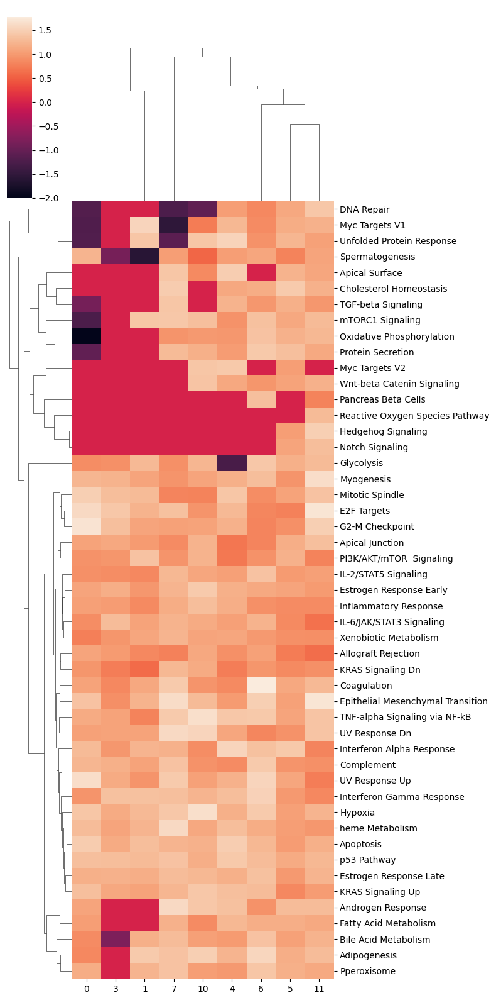

In [ ]:
#Reg3
import seaborn as sns

sns.clustermap(HLMRK_Leidens, figsize=(8,16))

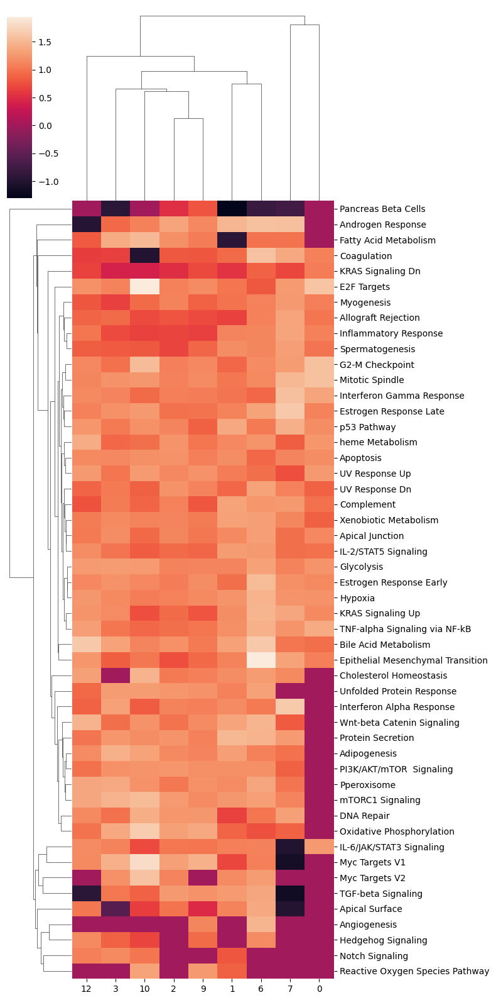

In [ ]:
#Reg3
import seaborn as sns

sns.clustermap(HLMRK_Leidens, figsize=(8,16))

In [29]:
plot_adata(adata, "leiden", plot_type="spatial", keyword=None, save=None, Title = "TM only Spatial embedding — clusters for R2")

In [27]:
#All Names of databases 

# names = gseapy.get_library_name()
# names   # show the first 20 entries